## Wizualizacja dużych zbiorów danych

# A7 - Text Visualization

### Autorzy: Karol Wyrębkiewicz, Paulina Skrzypczak

Wizualne przedstawienie zawartości dokumentu tekstowego jest jednym z najważniejszych zadań w dziedzinie eksploracji tekstu. Dla analityków nie tylko ważna jest treść, ale także podsumowanie używanego słownictwa oraz wskazanie pewnych cech tekstu. Istnieją pewne luki pomiędzy wizualizacją danych nieustrukturyzowanych (tekstowych) a danymi ustrukturyzowanymi. Na przykład wiele wizualizacji tekstowych nie reprezentuje tekstu bezpośrednio, lecz wynik modelu językowego (liczba słów, długość znaków, sekwencje słów itp.).

Skorzystamy ze zbioru danych *Womens Clothing E-Commerce Reviews*.

Na początku zaimportujmy wszelkie potrzebne biblioteki.

In [7]:
conda install seaborn plotly textblob cufflinks-py spacy spacy-model-en_core_web_sm bokeh scikit-learn matplotlib numpy pandas -y

Channels:
 - defaults
 - conda-forge
Platform: linux-64
Solving environment: done

## Package Plan ##

  environment location: /home/mateu/miniconda3/envs/py_3_10

  added / updated specs:
    - bokeh
    - cufflinks-py
    - matplotlib
    - numpy
    - pandas
    - plotly
    - scikit-learn
    - seaborn
    - spacy
    - spacy-model-en_core_web_sm
    - textblob


The following packages will be downloaded:

    package                    |            build
    ---------------------------|-----------------
    numpy-1.26.4               |  py310heeff2f4_0          10 KB
    numpy-base-1.26.4          |  py310h8a23956_0         7.2 MB
    scikit-learn-1.3.0         |  py310h1128e8f_1         8.4 MB
    ------------------------------------------------------------
                                           Total:        15.6 MB

The following NEW packages will be INSTALLED:

  numpy-base         pkgs/main/linux-64::numpy-base-1.26.4-py310h8a23956_0 
  scikit-learn       pkgs/main/linux-

In [11]:
import pandas as pd
import numpy as np
from textblob import TextBlob
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
import warnings 
warnings.filterwarnings('ignore')
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
matplotlib.rcParams['figure.figsize'] = (10.0, 6.0)
import plotly.graph_objs as go
# import plotly.plotly as py
import cufflinks
pd.options.display.max_columns = 30
from IPython.core.interactiveshell import InteractiveShell
import plotly.figure_factory as ff
InteractiveShell.ast_node_interactivity = 'all'
from plotly.offline import iplot
cufflinks.go_offline()
cufflinks.set_config_file(world_readable=True, theme='pearl')
from sklearn.decomposition import TruncatedSVD
from sklearn.decomposition import LatentDirichletAllocation
from sklearn.manifold import TSNE
from bokeh.plotting import figure, output_file, show
from bokeh.models import Label
from bokeh.io import output_notebook
output_notebook()
from collections import Counter
# import scattertext as st
# import spacy
from pprint import pprint
# import en_core_web_sm
# nlp = spacy.load('en_core_web_md')

Loading BokehJS ...

In [12]:
df = pd.read_csv('Womens Clothing E-Commerce Reviews.csv')
df.head()

,Unnamed: 0,Clothing ID,Age,Title,Review Text,Rating,Recommended IND,Positive Feedback Count,Division Name,Department Name,Class Name
0,0,767,33,NaN,Absolutely wonderful - silky and sexy and comf...,4,1,0,Initmates,Intimate,Intimates
1,1,1080,34,NaN,Love this dress! it's sooo pretty. i happene...,5,1,4,General,Dresses,Dresses
2,2,1077,60,Some major design flaws,I had such high hopes for this dress and reall...,3,0,0,General,Dresses,Dresses
3,3,1049,50,My favorite buy!,"I love, love, love this jumpsuit. it's fun, fl...",5,1,0,General Petite,Bottoms,Pants
4,4,847,47,Flattering shirt,This shirt is very flattering to all due to th...,5,1,6,General,Tops,Blouses


In [13]:
print(df.columns)

Index(['Unnamed: 0', 'Clothing ID', 'Age', 'Title', 'Review Text', 'Rating',
       'Recommended IND', 'Positive Feedback Count', 'Division Name',
       'Department Name', 'Class Name'],
      dtype='object')


In [14]:
df.head()

,Unnamed: 0,Clothing ID,Age,Title,Review Text,Rating,Recommended IND,Positive Feedback Count,Division Name,Department Name,Class Name
0,0,767,33,NaN,Absolutely wonderful - silky and sexy and comf...,4,1,0,Initmates,Intimate,Intimates
1,1,1080,34,NaN,Love this dress! it's sooo pretty. i happene...,5,1,4,General,Dresses,Dresses
2,2,1077,60,Some major design flaws,I had such high hopes for this dress and reall...,3,0,0,General,Dresses,Dresses
3,3,1049,50,My favorite buy!,"I love, love, love this jumpsuit. it's fun, fl...",5,1,0,General Petite,Bottoms,Pants
4,4,847,47,Flattering shirt,This shirt is very flattering to all due to th...,5,1,6,General,Tops,Blouses


Po krótkiej analizie widzimy, że należy
- usunąć kolumnę „Tytuł”;
- usunąć wiersze, w których brakowało „Tekstu recenzji”;
- wyczyścić kolumnę „Tekst recenzji”;
- użyć TextBlob do obliczenia polaryzacji opinii mieszczącej się w zakresie [-1,1], gdzie 1 oznacza opinię pozytywną, a -1 oznacza opinię negatywną;
- utwowrzyć nową kolumnę na długość recenzji;
- utwowrzyć nową kolumnę na zliczanie słów w recenzji.

In [15]:
df.drop(columns=['Unnamed: 0'], inplace=True)
# df.drop(df.columns[0], axis=1, inplace=True)
a = 0 
for i in range(a,a+4):
    print(df['Review Text'][i])
    print(df['Rating'][i])
    print(df['Recommended IND'][i])
    print()

Absolutely wonderful - silky and sexy and comfortable
4
1

Love this dress!  it's sooo pretty.  i happened to find it in a store, and i'm glad i did bc i never would have ordered it online bc it's petite.  i bought a petite and am 5'8".  i love the length on me- hits just a little below the knee.  would definitely be a true midi on someone who is truly petite.
5
1

I had such high hopes for this dress and really wanted it to work for me. i initially ordered the petite small (my usual size) but i found this to be outrageously small. so small in fact that i could not zip it up! i reordered it in petite medium, which was just ok. overall, the top half was comfortable and fit nicely, but the bottom half had a very tight under layer and several somewhat cheap (net) over layers. imo, a major design flaw was the net over layer sewn directly into the zipper - it c
3
0

I love, love, love this jumpsuit. it's fun, flirty, and fabulous! every time i wear it, i get nothing but great compliments!
5

In [16]:
df.drop(columns=['Title'], inplace=True)
df = df[~df['Review Text'].isnull()]

In [17]:
df.head()

,Clothing ID,Age,Review Text,Rating,Recommended IND,Positive Feedback Count,Division Name,Department Name,Class Name
0,767,33,Absolutely wonderful - silky and sexy and comf...,4,1,0,Initmates,Intimate,Intimates
1,1080,34,Love this dress! it's sooo pretty. i happene...,5,1,4,General,Dresses,Dresses
2,1077,60,I had such high hopes for this dress and reall...,3,0,0,General,Dresses,Dresses
3,1049,50,"I love, love, love this jumpsuit. it's fun, fl...",5,1,0,General Petite,Bottoms,Pants
4,847,47,This shirt is very flattering to all due to th...,5,1,6,General,Tops,Blouses


In [18]:
def preprocess(ReviewText):
    ReviewText = ReviewText.str.replace("(<br/>)", "")
    ReviewText = ReviewText.str.replace('(<a).*(>).*(</a>)', '')
    ReviewText = ReviewText.str.replace('(&amp)', '')
    ReviewText = ReviewText.str.replace('(&gt)', '')
    ReviewText = ReviewText.str.replace('(&lt)', '')
    ReviewText = ReviewText.str.replace('(\xa0)', ' ')  
    return ReviewText

df['Review Text'] = preprocess(df['Review Text'])

In [19]:
df['polarity'] = df['Review Text'].map(lambda text: TextBlob(text).sentiment.polarity)
df['review_len'] = df['Review Text'].astype(str).apply(len)
df['word_count'] = df['Review Text'].apply(lambda x: len(str(x).split()))

Aby sprawdzić, czy wskaźnik polaryzacji sentymentalnej działa, losowo wybieramy 5 recenzji z pozytywnym (1) wynikiem polaryzacji:

In [20]:
print('5 random reviews with the highest positive sentiment polarity: \n')
cl = df.loc[df.polarity == 1, ['Review Text']].sample(5).values
for c in cl:
    print(c[0])

5 random reviews with the highest positive sentiment polarity: 

Perfect way to add warmth in transition weather
This is the perfect holiday dress. my best purchase of the season!
I love it!!! i can wear out to dinner or just out to lunch with
friends!
This is a perfect jacket over any shirt, tee, or dress. jacket is well made and goes with anything!
For a now feel, that comfy and well made, this was a great choice!


Następnie losowo wybieramy 5 recenzji z najbardziej neutralnym wynikiem polaryzacji nastrojów (0):

In [21]:
print('5 random reviews with the most neutral sentiment(zero) polarity: \n')
cl = df.loc[df.polarity == 0, ['Review Text']].sample(5).values
for c in cl:
    print(c[0])

5 random reviews with the most neutral sentiment(zero) polarity: 

If you have an hourglass figure this dress accentuates your curves. i do need to wear a tank underneath as dress is low cut.
I am somewhere between a size 6 or 8, so i ordered this dress in a size small. mistake. too small. the color of this dress is so lovely. it's between red and orange. will probably order it in medium.
I tried on this dress in store and was amazed by the quality and simple structure of the dress. bought it with no hesitation.
The only thing i did not like about this jacket was that i could not find it in my size before it sold out! retailer, please bring back another iteration for spring!
With the pleats, probably need to tuck in shirt. these were too big for me, so need to return.


In [22]:
df.polarity.min()

-0.9750000000000001

In [23]:
df.loc[df.polarity == -0.9750000000000001]

,Clothing ID,Age,Review Text,Rating,Recommended IND,Positive Feedback Count,Division Name,Department Name,Class Name,polarity,review_len,word_count
14754,868,52,"Cut out design, no seems or hems.\r\n very dis...",1,0,0,General,Tops,Knits,-0.975,65,11
20502,870,61,Received this product with a gaping hole in it...,1,0,1,General,Tops,Knits,-0.975,121,21


Jak widać, w każdym wyniku możemy wyłapać najbardziej charakterystyczne słowa. A to tylko 10 recenzji. W naszej bazie występują też dwie negatywne recenzje, wyświetlimy je poniżej.

In [24]:
print('2 reviews with the most negative polarity: \n')
cl = df.loc[df.polarity == -0.97500000000000009, ['Review Text']].sample(2).values
for c in cl:
    print(c[0])

2 reviews with the most negative polarity: 

Received this product with a gaping hole in it. very disappointed in the quality and the quality control at the warehouse
Cut out design, no seems or hems.
 very disappointed in retailer


## Wizualizacja jednowymiarowa za pomocą Plotly

To najprostszy rodzaj wizualizacji, który składa się z obserwacji tylko jednej cechy lub atrybutu. Wizualizacja jednowymiarowa obejmuje histogram, wykresy słupkowe i wykresy liniowe.

#### Rozkład ocen recenzji

In [25]:
df['Rating'].iplot( 
    kind='hist', 
    xTitle='rating', 
    linecolor='black', 
    yTitle='count', 
    title='Przejrzyj rozkład ocen')

Oceny są zgodne z oceną polaryzacji, co oznacza, że większość ocen jest dość wysoka w zakresie 4 lub 5.

Możemy zrobić więcej wykresów dotyczących analizy wieku recenzentów, długość recenzji, liczba słów w recenzji itd., ale nie temu służyć będzie nasz notebook.

**Ćwiczenie 1**

Narysuj wykres pokazujący liczbę słów w tekście recenzji.

In [26]:
df['word_count'].iplot(
    kind='hist',
    bins=100,
    xTitle='word count',
    linecolor='black',
    yTitle='review count',
    title='Przejrzyj rozkład liczby słów w tekście')

Teraz dochodzimy do funkcji “Review Text”. Zanim zbadamy tę funkcję, musimy wyodrębnić funkcje *N-Gram*. **N-gramy** służą do opisu liczby słów używanych jako punkty obserwacyjne, np. unigram oznacza jednowyrazową frazę, bigram oznacza frazę dwuwyrazową, a trigram oznacza frazę trzywyrazową. Aby to zrobić, używamy *scikit-learn.CountVectorizer*.

#### Rozkład najwyższych unigramów przed i po usunięciu stop words

In [27]:
def get_top_n_words(corpus, n=None):
    vec = CountVectorizer().fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0) 
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq =sorted(words_freq, key = lambda x: x[1], reverse=True)
    return words_freq[:n]

common_words1 = get_top_n_words(df['Review Text'], 20)
for word, freq in common_words1:
    print(word, freq)
df1 = pd.DataFrame(common_words1, columns = ['ReviewText' , 'count'])
df1.groupby('ReviewText').sum()['count'].sort_values(ascending=False).iplot(
    kind='bar', yTitle='Count', linecolor='black', title='Top 20 words in review before removing stop words')


def get_top_n_words_without_ending(corpus, n=None):
    vec = CountVectorizer(stop_words = 'english').fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0) 
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq =sorted(words_freq, key = lambda x: x[1], reverse=True)
    return words_freq[:n]

common_words2 = get_top_n_words_without_ending(df['Review Text'], 20)
for word, freq in common_words2:
    print(word, freq)
df2 = pd.DataFrame(common_words2, columns = ['ReviewText' , 'count'])
df2.groupby('ReviewText').sum()['count'].sort_values(ascending=False).iplot(
    kind='bar', yTitle='Count', linecolor='black', title='Top 20 words in review after removing stop words')

the 76166
it 49284
and 49009
is 30641
this 25762
to 24583
in 20723
but 16556
on 15328
for 14000
of 13429
with 12803
was 12221
so 12023
my 11028
dress 10567
that 10014
not 9799
love 8951
size 8772


dress 10567
love 8951
size 8772
fit 7325
like 7149
wear 6439
great 6117
just 5608
fabric 4798
small 4729
color 4605
look 4039
really 3925
ordered 3850
little 3775
perfect 3774
flattering 3519
soft 3343
comfortable 3060
cute 3042


Możemy też zrobić to z bigramami i trigramami. Poniżej przykład bigramów przed usunięciem stop words.

In [28]:
def get_top_n_bigram(corpus, n=None):
    vec = CountVectorizer(ngram_range=(2, 2)).fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0) 
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq =sorted(words_freq, key = lambda x: x[1], reverse=True)
    return words_freq[:n]

common_words = get_top_n_bigram(df['Review Text'], 20)
for word, freq in common_words:
    print(word, freq)
df3 = pd.DataFrame(common_words, columns = ['ReviewText' , 'count'])
df3.groupby('ReviewText').sum()['count'].sort_values(ascending=False).iplot(
    kind='bar', yTitle='Count', linecolor='black', title='Top 20 bigrams in review before removing stop words')

in the 7169
it is 6169
and the 5614
this dress 4758
on the 4338
of the 3932
and it 3725
it was 3100
this top 2939
this is 2750
the fabric 2655
love the 2641
love this 2333
is very 2321
to wear 2267
but it 2196
the dress 2180
with the 2057
for me 2026
but the 1974


**Ćwiczenie 2**

Stwórz historam przedstawiający digram po usunięciu stop words

In [29]:
def get_top_n_bigram_without_ending(corpus, n=None):
    vec = CountVectorizer(ngram_range=(2, 2), stop_words = 'english').fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0) 
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq =sorted(words_freq, key = lambda x: x[1], reverse=True)
    return words_freq[:n]

common_words = get_top_n_bigram(df['Review Text'], 20)
for word, freq in common_words:
    print(word, freq)
    
df4 = pd.DataFrame(common_words, columns = ['ReviewText' , 'count'])
df4.groupby('ReviewText').sum()['count'].sort_values(ascending=False).iplot(
    kind='bar', yTitle='Count', linecolor='black', title='Top 20 bigrams in review after removing stop words')

in the 7169
it is 6169
and the 5614
this dress 4758
on the 4338
of the 3932
and it 3725
it was 3100
this top 2939
this is 2750
the fabric 2655
love the 2641
love this 2333
is very 2321
to wear 2267
but it 2196
the dress 2180
with the 2057
for me 2026
but the 1974


#### Analiza długości recenzji względem działu ubrań

In [30]:
y0 = df.loc[df['Department Name'] == 'Tops']['review_len']
y1 = df.loc[df['Department Name'] == 'Dresses']['review_len']
y2 = df.loc[df['Department Name'] == 'Bottoms']['review_len']
y3 = df.loc[df['Department Name'] == 'Intimate']['review_len']
y4 = df.loc[df['Department Name'] == 'Jackets']['review_len']
y5 = df.loc[df['Department Name'] == 'Trend']['review_len']

trace0 = go.Box(
    y=y0,
    name = 'Tops',
    marker = dict(
        color = 'rgb(214, 12, 140)',
    )
)
trace1 = go.Box(
    y=y1,
    name = 'Dresses',
    marker = dict(
        color = 'rgb(0, 128, 128)',
    )
)
trace2 = go.Box(
    y=y2,
    name = 'Bottoms',
    marker = dict(
        color = 'rgb(10, 140, 208)',
    )
)
trace3 = go.Box(
    y=y3,
    name = 'Intimate',
    marker = dict(
        color = 'rgb(12, 102, 14)',
    )
)
trace4 = go.Box(
    y=y4,
    name = 'Jackets',
    marker = dict(
        color = 'rgb(10, 0, 100)',
    )
)
trace5 = go.Box(
    y=y5,
    name = 'Trend',
    marker = dict(
        color = 'rgb(100, 0, 10)',
    )
)
data = [trace0, trace1, trace2, trace3, trace4, trace5]
layout = go.Layout(
    title = "Review length Boxplot of Department Name"
)

fig = go.Figure(data=data,layout=layout)
iplot(fig, filename = "Review Length Boxplot of Department Name")

Mediana długości recenzji w działach 'Topy' i 'Bielizna' jest stosunkowo krótsza niż w pozostałych działach.

#### Wspólny wykres 2D Density przedstawiający polaryzację sentymentalną w funkcji oceny

In [31]:
trace1 = go.Scatter(
    x=df['polarity'], y=df['Rating'], mode='markers', name='points',
    marker=dict(color='rgb(102,0,0)', size=2, opacity=0.4)
)
trace2 = go.Histogram2dContour(
    x=df['polarity'], y=df['Rating'], name='density', ncontours=20,
    colorscale='Hot', reversescale=True, showscale=False
)
trace3 = go.Histogram(
    x=df['polarity'], name='Sentiment polarity density',
    marker=dict(color='rgb(102,0,0)'),
    yaxis='y2'
)
trace4 = go.Histogram(
    y=df['Rating'], name='Rating density', marker=dict(color='rgb(102,0,0)'),
    xaxis='x2'
)
data = [trace1, trace2, trace3, trace4]

layout = go.Layout(
    showlegend=False,
    autosize=False,
    width=600,
    height=550,
    xaxis=dict(
        domain=[0, 0.85],
        showgrid=False,
        zeroline=False
    ),
    yaxis=dict(
        domain=[0, 0.85],
        showgrid=False,
        zeroline=False
    ),
    margin=dict(
        t=50
    ),
    hovermode='closest',
    bargap=0,
    xaxis2=dict(
        domain=[0.85, 1],
        showgrid=False,
        zeroline=False
    ),
    yaxis2=dict(
        domain=[0.85, 1],
        showgrid=False,
        zeroline=False
    )
)

fig = go.Figure(data=data, layout=layout)
iplot(fig, filename='2dhistogram-2d-density-plot-subplots')

In [32]:
df[['Rating', 'Age']].iplot(secondary_y='Age', secondary_y_title='Age',
    kind='box', yTitle='Rating', title='Box Plot of Age and Rating')

#### Wspólny wykres gęstości 2D dotyczący polaryzacji sentymentalnej i wieku

In [33]:
trace1 = go.Scatter(
    x=df['Age'], y=df['polarity'], mode='markers', name='points',
    marker=dict(color='rgb(102,0,0)', size=2, opacity=0.4)
)
trace2 = go.Histogram2dContour(
    x=df['Age'], y=df['polarity'], name='density', ncontours=20,
    colorscale='Hot', reversescale=True, showscale=False
)
trace3 = go.Histogram(
    x=df['Age'], name='Age density',
    marker=dict(color='rgb(102,0,0)'),
    yaxis='y2'
)
trace4 = go.Histogram(
    y=df['polarity'], name='Sentiment Polarity density', marker=dict(color='rgb(102,0,0)'),
    xaxis='x2'
)
data = [trace1, trace2, trace3, trace4]

layout = go.Layout(
    showlegend=False,
    autosize=False,
    width=600,
    height=550,
    xaxis=dict(
        domain=[0, 0.85],
        showgrid=False,
        zeroline=False
    ),
    yaxis=dict(
        domain=[0, 0.85],
        showgrid=False,
        zeroline=False
    ),
    margin=dict(
        t=50
    ),
    hovermode='closest',
    bargap=0,
    xaxis2=dict(
        domain=[0.85, 1],
        showgrid=False,
        zeroline=False
    ),
    yaxis2=dict(
        domain=[0.85, 1],
        showgrid=False,
        zeroline=False
    )
)

fig = go.Figure(data=data, layout=layout)
iplot(fig, filename='2dhistogram-2d-density-plot-subplots')

Z wykresów wynika, że niewiele osób było bardzo pozytywnych lub bardzo negatywnych. Osoby wystawiające recenzje od neutralnych do pozytywnych częściej są po trzydziestce. Prawdopodobnie osoby w tym wieku są bardziej aktywne.

#### Tekst przeglądu modelowania tematycznego

Na koniec chcemy zbadać algorytm modelowania tematycznego dla tego zbioru danych, aby sprawdzić, czy przyniesie on jakiekolwiek korzyści i czy pasuje do tego, co robimy w przypadku naszej funkcji tekstu recenzji.

Będziemy eksperymentować z techniką utajonej analizy semantycznej (LSA) w modelowaniu tematów.

- Generowanie naszej macierzy terminów dokumentu z tekstu przeglądu do macierzy cech TF-IDF .
- Model LSA zastępuje surowe liczby w macierzy terminów dokumentu oceną TF-IDF.
- Wykonaj redukcję wymiarowości na macierzy terminów dokumentu, używając obciętego SVD .
- Ponieważ liczba działów wynosi 6, ustawiamy n_topics=6.
- Biorąc pod uwagę argmaxkażdy tekst recenzji w tej macierzy tematów, otrzymasz przewidywane tematy każdego tekstu recenzji w danych. Następnie możemy posortować je według liczby poszczególnych tematów.
- Aby lepiej zrozumieć każdy temat, znajdziemy trzy najczęstsze słowa w każdym temacie.

In [34]:
reindexed_data = df['Review Text']
tfidf_vectorizer = TfidfVectorizer(stop_words='english', use_idf=True, smooth_idf=True)
reindexed_data = reindexed_data.values
document_term_matrix = tfidf_vectorizer.fit_transform(reindexed_data)
n_topics = 6
lsa_model = TruncatedSVD(n_components=n_topics)
lsa_topic_matrix = lsa_model.fit_transform(document_term_matrix)

def get_keys(topic_matrix):
    '''
    returns an integer list of predicted topic 
    categories for a given topic matrix
    '''
    keys = topic_matrix.argmax(axis=1).tolist()
    return keys

def keys_to_counts(keys):
    '''
    returns a tuple of topic categories and their 
    accompanying magnitudes for a given list of keys
    '''
    count_pairs = Counter(keys).items()
    categories = [pair[0] for pair in count_pairs]
    counts = [pair[1] for pair in count_pairs]
    return (categories, counts)
    
lsa_keys = get_keys(lsa_topic_matrix)
lsa_categories, lsa_counts = keys_to_counts(lsa_keys)

def get_top_n_words(n, keys, document_term_matrix, tfidf_vectorizer):
    '''
    returns a list of n_topic strings, where each string contains the n most common 
    words in a predicted category, in order
    '''
    top_word_indices = []
    for topic in range(n_topics):
        temp_vector_sum = 0
        for i in range(len(keys)):
            if keys[i] == topic:
                temp_vector_sum += document_term_matrix[i]
        temp_vector_sum = temp_vector_sum.toarray()
        top_n_word_indices = np.flip(np.argsort(temp_vector_sum)[0][-n:],0)
        top_word_indices.append(top_n_word_indices)   
    top_words = []
    for topic in top_word_indices:
        topic_words = []
        for index in topic:
            temp_word_vector = np.zeros((1,document_term_matrix.shape[1]))
            temp_word_vector[:,index] = 1
            the_word = tfidf_vectorizer.inverse_transform(temp_word_vector)[0][0]
            topic_words.append(the_word.encode('ascii').decode('utf-8'))
        top_words.append(" ".join(topic_words))         
    return top_words
    
top_n_words_lsa = get_top_n_words(3, lsa_keys, document_term_matrix, tfidf_vectorizer)

for i in range(len(top_n_words_lsa)):
    print("Topic {}: ".format(i+1), top_n_words_lsa[i])

Topic 1:  love dress size
Topic 2:  dress beautiful love
Topic 3:  love great comfortable
Topic 4:  size true small
Topic 5:  shirt cute love
Topic 6:  great cute fit


**Ćwiczenie 4**

Narysuj wykres przedstawiający tematykę LSA.

In [35]:
top_3_words = get_top_n_words(3, lsa_keys, document_term_matrix, tfidf_vectorizer)
labels = ['Topic {}: \n'.format(i) + top_3_words[i] for i in lsa_categories]

fig = {
    'data': [
        {
            'x': top_3_words,
            'y': lsa_counts,
            'type': 'bar',
            'hoverinfo': 'text',
        }
    ],
    'layout': {
        'title': 'LSA Topic Category Counts',
        'xaxis': {
            'title': 'Category'
        },
        'yaxis': {
            'title': 'Count'
        }
    }
}

iplot(fig)

## Wizualizacja

### N-gram word cloud

Skorzystamy z nowej bazy, dotyczącej recenzji filmów.

In [36]:
df = pd.read_csv('train.csv')
df.head()

,text,sentiment
0,"Now, I won't deny that when I purchased this o...",neg
1,"The saddest thing about this ""tribute"" is that...",neg
2,Last night I decided to watch the prequel or s...,neg
3,I have to admit that i liked the first half of...,neg
4,I was not impressed about this film especially...,neg


In [37]:
# Data import
import pandas as pd

reviews_negative = open('reviews_negative_long.txt',encoding='utf8').read()
reviews_positive = open('reviews_positive_long.txt',encoding='utf8').read()

In [40]:
conda install Pillow wordcloud

Channels:
 - defaults
 - conda-forge
Platform: linux-64
Solving environment: done

## Package Plan ##

  environment location: /home/mateu/miniconda3/envs/py_3_10

  added / updated specs:
    - pillow
    - wordcloud


The following packages will be downloaded:

    package                    |            build
    ---------------------------|-----------------
    wordcloud-1.9.3            |  py310h5eee18b_0         192 KB
    ------------------------------------------------------------
                                           Total:         192 KB

The following NEW packages will be INSTALLED:

  wordcloud          pkgs/main/linux-64::wordcloud-1.9.3-py310h5eee18b_0 



                                                                                
Preparing transaction: done
Verifying transaction: done
Executing transaction: done

Note: you may need to restart the kernel to use updated packages.


In [41]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Generate a word cloud - negative sentiment
wordcloud_neg = WordCloud(collocation_threshold=2,
                          collocations=True,
                          background_color="white",
                          colormap="afmhot").generate(reviews_negative)

**Ćwiczenie 5**

Stwórz wordcloud dla positive sentiment.

In [42]:
wordcloud_pos = WordCloud(collocation_threshold=2,
                          collocations=True,
                          background_color="white",
                          colormap="afmhot").generate(reviews_positive)

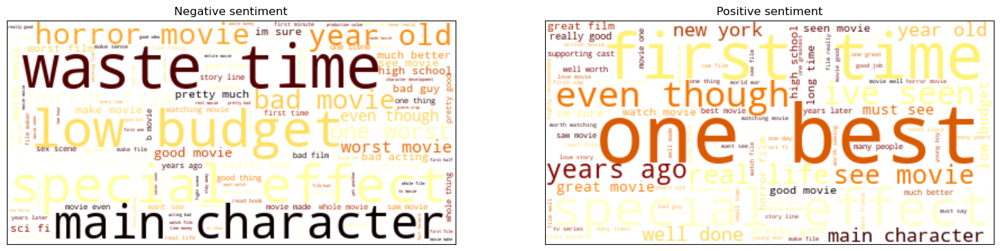

In [43]:
fig, (ax1, ax2) = plt.subplots(1, 2)
fig.set_size_inches(18.5, 10.5, forward=True)
ax1.imshow(wordcloud_neg,interpolation="bilinear")
ax2.imshow(wordcloud_pos,interpolation="bilinear")
ax1.title.set_text('Negative sentiment')
ax2.title.set_text('Positive sentiment')
ax1.axes.xaxis.set_visible(False)
ax1.axes.yaxis.set_visible(False)
ax2.axes.xaxis.set_visible(False)
ax2.axes.yaxis.set_visible(False)
plt.savefig('bigram_wordcloud.png',dpi=500, bbox_inches='tight')
plt.show()

In [44]:
conda install openpyxl=3.1.2

Channels:
 - defaults
 - conda-forge
Platform: linux-64
Solving environment: done

# All requested packages already installed.


Note: you may need to restart the kernel to use updated packages.


In [45]:
# Wordcloud - trigrams
trigrams_neg = pd.read_excel('trigrams_neg.xlsx')
trigrams_pos = pd.read_excel('trigrams_pos.xlsx')

trigrams_neg_dict = trigrams_neg.set_index('word')['frequency'].to_dict()
trigrams_pos_dict = trigrams_pos.set_index('word')['frequency'].to_dict()

In [46]:
from wordcloud import WordCloud

# Generate a word cloud - negative sentiment
wordcloud_trigrams_neg = WordCloud(background_color="white",
                          colormap="twilight_shifted").generate_from_frequencies(trigrams_neg_dict)

# Generate a word cloud - positive sentiment
wordcloud_trigrams_pos = WordCloud(background_color="white",
                          colormap="hsv").generate_from_frequencies(trigrams_pos_dict)

**Ćwiczenie 6**

Wyświetl wordcloud dla trigramów.

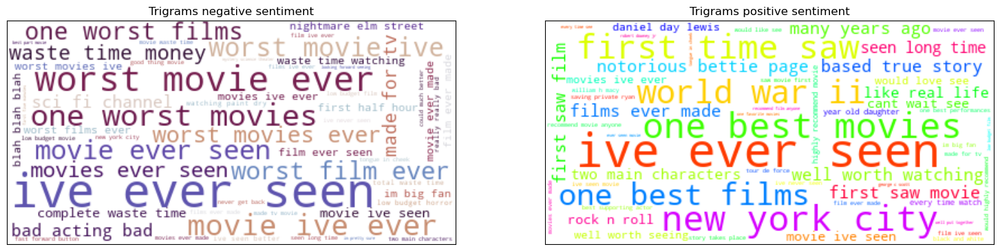

In [47]:
fig, (ax1, ax2) = plt.subplots(1, 2)
fig.set_size_inches(18.5, 10.5, forward=True)
ax1.imshow(wordcloud_trigrams_neg,interpolation="bilinear")
ax2.imshow(wordcloud_trigrams_pos,interpolation="bilinear")
ax1.title.set_text('Trigrams negative sentiment')
ax2.title.set_text('Trigrams positive sentiment')
ax1.axes.xaxis.set_visible(False)
ax1.axes.yaxis.set_visible(False)
ax2.axes.xaxis.set_visible(False)
ax2.axes.yaxis.set_visible(False)
plt.savefig('trigram_wordcloud.png',dpi=500, bbox_inches='tight')
plt.show()

### Bubble chart

In [48]:
# Class available from https://matplotlib.org/3.5.0/gallery/misc/packed_bubbles.html
import numpy as np

class BubbleChart:
    def __init__(self, area, bubble_spacing=0):
        area = np.asarray(area)
        r = np.sqrt(area / np.pi)

        self.bubble_spacing = bubble_spacing
        self.bubbles = np.ones((len(area), 4))
        self.bubbles[:, 2] = r
        self.bubbles[:, 3] = area
        self.maxstep = 2 * self.bubbles[:, 2].max() + self.bubble_spacing
        self.step_dist = self.maxstep / 2

        # calculate initial grid layout for bubbles
        length = np.ceil(np.sqrt(len(self.bubbles)))
        grid = np.arange(length) * self.maxstep
        gx, gy = np.meshgrid(grid, grid)
        self.bubbles[:, 0] = gx.flatten()[:len(self.bubbles)]
        self.bubbles[:, 1] = gy.flatten()[:len(self.bubbles)]

        self.com = self.center_of_mass()

    def center_of_mass(self):
        return np.average(
            self.bubbles[:, :2], axis=0, weights=self.bubbles[:, 3]
        )

    def center_distance(self, bubble, bubbles):
        return np.hypot(bubble[0] - bubbles[:, 0],
                        bubble[1] - bubbles[:, 1])

    def outline_distance(self, bubble, bubbles):
        center_distance = self.center_distance(bubble, bubbles)
        return center_distance - bubble[2] - bubbles[:, 2] - self.bubble_spacing

    def check_collisions(self, bubble, bubbles):
        distance = self.outline_distance(bubble, bubbles)
        return len(distance[distance < 0])

    def collides_with(self, bubble, bubbles):
        distance = self.outline_distance(bubble, bubbles)
        idx_min = np.argmin(distance)
        return idx_min if type(idx_min) == np.ndarray else [idx_min]

    def collapse(self, n_iterations=50):

        for _i in range(n_iterations):
            moves = 0
            for i in range(len(self.bubbles)):
                rest_bub = np.delete(self.bubbles, i, 0)
                # try to move directly towards the center of mass
                # direction vector from bubble to the center of mass
                dir_vec = self.com - self.bubbles[i, :2]

                # shorten direction vector to have length of 1
                dir_vec = dir_vec / np.sqrt(dir_vec.dot(dir_vec))

                # calculate new bubble position
                new_point = self.bubbles[i, :2] + dir_vec * self.step_dist
                new_bubble = np.append(new_point, self.bubbles[i, 2:4])

                # check whether new bubble collides with other bubbles
                if not self.check_collisions(new_bubble, rest_bub):
                    self.bubbles[i, :] = new_bubble
                    self.com = self.center_of_mass()
                    moves += 1
                else:
                    # try to move around a bubble that you collide with
                    # find colliding bubble
                    for colliding in self.collides_with(new_bubble, rest_bub):
                        # calculate direction vector
                        dir_vec = rest_bub[colliding, :2] - self.bubbles[i, :2]
                        dir_vec = dir_vec / np.sqrt(dir_vec.dot(dir_vec))
                        # calculate orthogonal vector
                        orth = np.array([dir_vec[1], -dir_vec[0]])
                        # test which direction to go
                        new_point1 = (self.bubbles[i, :2] + orth *
                                      self.step_dist)
                        new_point2 = (self.bubbles[i, :2] - orth *
                                      self.step_dist)
                        dist1 = self.center_distance(
                            self.com, np.array([new_point1]))
                        dist2 = self.center_distance(
                            self.com, np.array([new_point2]))
                        new_point = new_point1 if dist1 < dist2 else new_point2
                        new_bubble = np.append(new_point, self.bubbles[i, 2:4])
                        if not self.check_collisions(new_bubble, rest_bub):
                            self.bubbles[i, :] = new_bubble
                            self.com = self.center_of_mass()

            if moves / len(self.bubbles) < 0.1:
                self.step_dist = self.step_dist / 2

    def plot(self, ax, labels, colors):

        for i in range(len(self.bubbles)):
            circ = plt.Circle(
                self.bubbles[i, :2], self.bubbles[i, 2], color=colors[i])
            ax.add_patch(circ)
            ax.text(*self.bubbles[i, :2], labels[i],
                    horizontalalignment='center', verticalalignment='center')

In [49]:
data = {
    'bigrams': ['ever seen',
                'ive seen',
                'special effects',
                'even though',
                'one best',
                'low budget',
                'looks like',
                'year old',
                'waste time',
                'first time',
                'see movie',
                'im sure',
                'good movie'],

    'frequency': [41212, 4215,4119,
                  4106, 3184,  35151, 3214,
                  3123, 13014, 2185,
                  2813,2813, 27112],

    'color': ['magenta', 'pink', 'salmon', 'gold',
              'yellow', 'orange', 'grey', 'blue',
              'goldenrod','darkorchid', 'turquoise', 'skyblue',
              'coral']
}

In [50]:
bubble_chart = BubbleChart(area=data['frequency'],
                           bubble_spacing=0.1)
bubble_chart.collapse()

(0.0, 1.0, 0.0, 1.0)

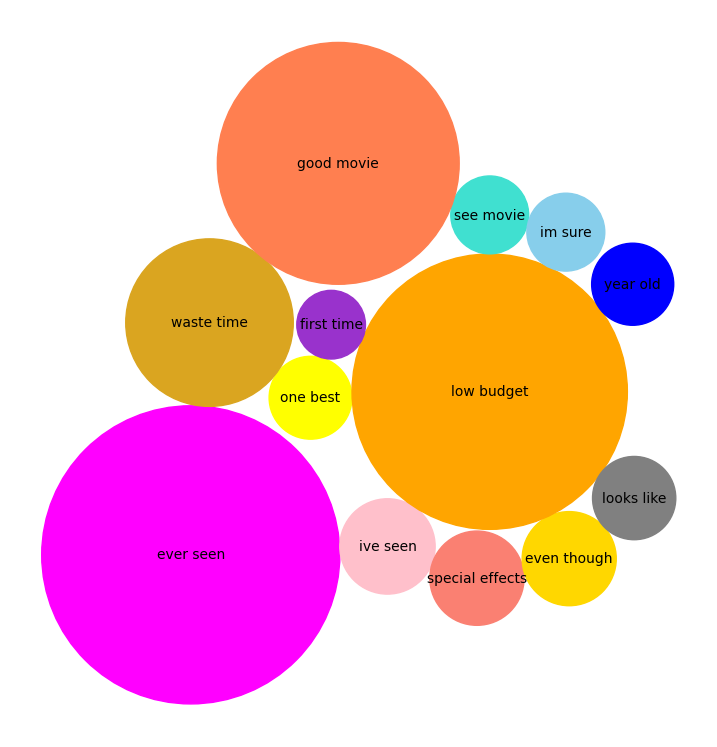

In [51]:
# Display the image
import matplotlib.pyplot as plt

fig, ax = plt.subplots(subplot_kw=dict(aspect="equal"))
fig.set_size_inches(9, 13, forward=True)
bubble_chart.plot(
    ax, data['bigrams'], data['color'])
ax.axis("off")
ax.relim()
ax.autoscale_view()
# plt.savefig('bubble_chart_small.png',dpi=1500, bbox_inches='tight')
plt.show()